In [1]:
import xarray as xr
import xesmf as xe
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import dask
import cftime
import random
import glob
import matplotlib.gridspec as gs

In [2]:
from dask.distributed import Client, LocalCluster
client = Client()
client

/g/data/hh5/public/apps/miniconda3/envs/analysis3-22.10/lib/python3.9/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 35923 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/35923/status,
Dashboard: /proxy/35923/status,Workers: 7
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42307,Workers: 7
Dashboard: /proxy/35923/status,Total threads: 14
Started: Just now,Total memory: 63.00 GiB
Comm: tcp://127.0.0.1:41797,Total threads: 2
Dashboard: /proxy/42545/status,Memory: 9.00 GiB
Nanny: tcp://127.0.0.1:46365,


In [3]:
def regrid_ACCESS(ds, var):
    #rename coords
    ds = ds.rename({"geolon_t": "longitude", "geolat_t": "latitude"})
    #create the output grid
    ds_out = xe.util.grid_global(1, 1)
    ds_out = ds_out.drop({'lon_b', 'lat_b'})
    #rename grid coords
    ds_out = ds_out.rename({'lon': 'longitude', 'lat': 'latitude'})
    #drop the coords on input ds
    ds_in_1deg = ds.drop({'xt_ocean', 'yt_ocean'})
    #create regridder
    regridder_1deg = xe.Regridder(ds_in_1deg, ds_out, 'bilinear', periodic=True)
    #now regrid
    regridded = regridder_1deg(ds[var].chunk({'xt_ocean': -1, 'yt_ocean': -1}))
    regridded = regridded.assign_coords({'x': ds_out.longitude[0, :], 'y': ds_out.latitude[:, 0]})
    regridded = regridded.rename({'x': 'longitude', 'y': 'latitude'})
    return regridded

In [4]:
def regrid_ACCESS_u(ds, var):
    #rename coords
    ds = ds.rename({"geolon_c": "longitude", "geolat_c": "latitude"})
    #create the output grid
    ds_out = xe.util.grid_global(1, 1)
    ds_out = ds_out.drop({'lon_b', 'lat_b'})
    #rename grid coords
    ds_out = ds_out.rename({'lon': 'longitude', 'lat': 'latitude'})
    #drop the coords on input ds
    ds_in_1deg = ds.drop({'xu_ocean', 'yu_ocean'})
    #create regridder
    regridder_1deg = xe.Regridder(ds_in_1deg, ds_out, 'bilinear', periodic=True)
    #now regrid
    regridded = regridder_1deg(ds[var].chunk({'xu_ocean': -1, 'yu_ocean': -1}))
    regridded = regridded.assign_coords({'x': ds_out.longitude[0, :], 'y': ds_out.latitude[:, 0]})
    regridded = regridded.rename({'x': 'longitude', 'y': 'latitude'})
    return regridded

In [3]:
DS = xr.open_dataset("/g/data/hh5/tmp/zg0866/cm000_APP4_archive/cm000/history/ocn/ocean_month.nc-09601231", use_cftime=True, chunks= {"time":12})

In [5]:
DS = xr.open_dataset("/scratch/e14/sm2435/PACE_OC/cy286/history/ocn/ocean_month.nc-09601231", use_cftime=True, chunks= {"time":12})


In [4]:
sw_pn = DS.sw_heat

In [5]:
triver = DS.temp_rivermix
tvdbc = DS.temp_vdiffuse_sbc
sfc_hflux_pme = DS.sfc_hflux_pme

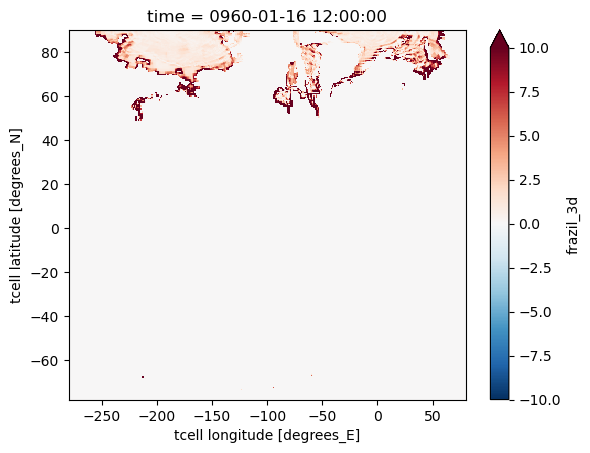

In [8]:
DS.frazil_3d.sum("st_ocean")[0].plot(vmin = -10)

In [6]:
Qnet = sw_pn + triver +tvdbc + sfc_hflux_pme

In [7]:
Qnet_intz = Qnet.sum("st_ocean")

In [8]:
Qnet_int = tvdbc.sum("st_ocean") + triver.sum("st_ocean") + sfc_hflux_pme + sw_pn.sum("st_ocean")

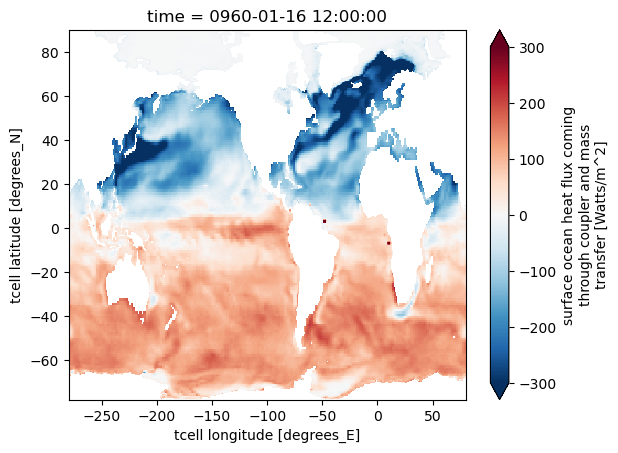

In [12]:
(DS.net_sfc_heating)[0].plot(vmin = -300)

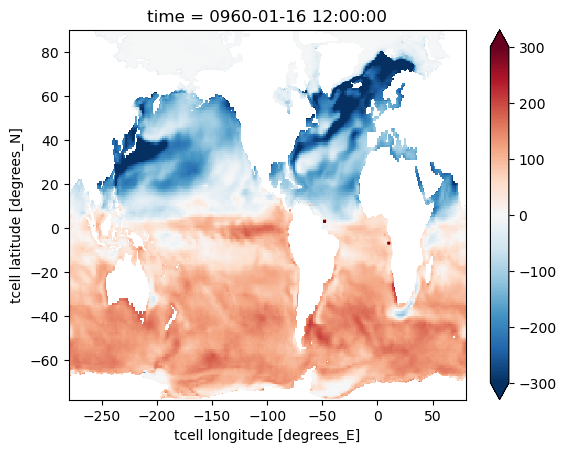

In [13]:
(Qnet_int)[0].plot(vmin = -300)

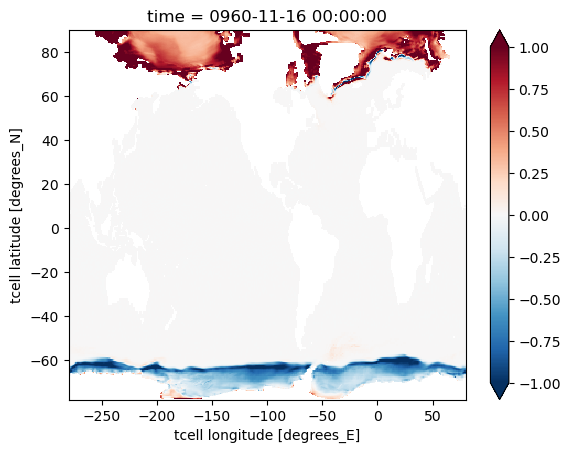

In [14]:
(Qnet_int-DS.net_sfc_heating )[10].plot(vmin = -1)

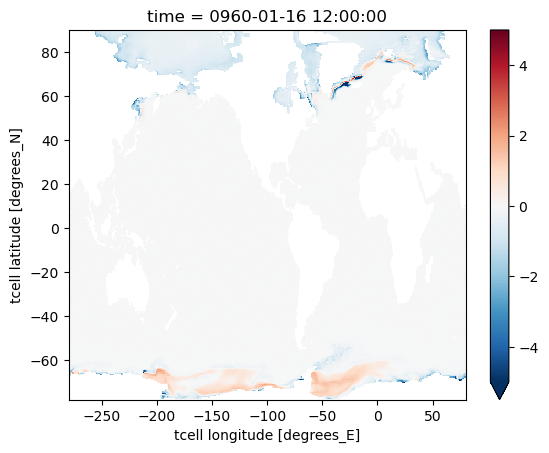

In [15]:
(DS.net_sfc_heating - tvdbc.sum("st_ocean") - triver.sum("st_ocean") - sfc_hflux_pme - sw_pn.sum("st_ocean"))[0].plot(vmin = -5)

In [9]:
lw = DS.lw_heat

In [10]:
latent = DS.evap_heat

In [11]:
sens = DS.sens_heat

In [12]:
sw = DS.swflx

In [13]:
f3d = DS.frazil_3d

In [14]:
vdiffimp = DS.temp_vdiffuse_impl

In [15]:
calving_melt_heat = DS.calving_melt_heat
evap_heat = DS.evap_heat
fprec_melt_heat = DS.fprec_melt_heat

In [16]:
Qnet2 = lw+sw+latent+sens

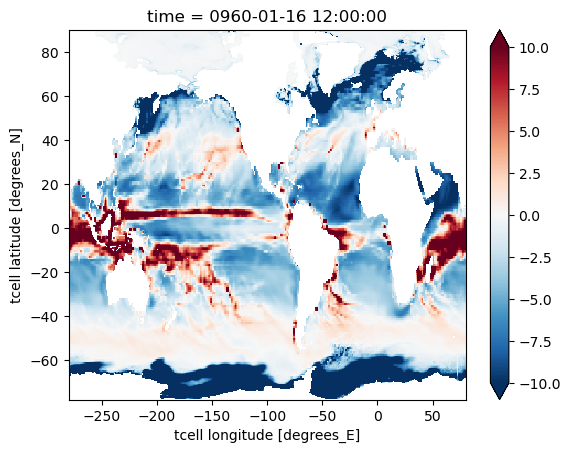

In [24]:
(DS.net_sfc_heating -Qnet2)[0].plot(vmin = -10)

In [17]:
Qnet3 = lw+sw+latent+sens+calving_melt_heat+evap_heat+fprec_melt_heat

In [18]:
net_sfc_heating = sfc_hflux_coupler + sfc_hflux_pme + sfc_hflux_from_runoff + sfc_hflux_from_calving

NameError: name 'sfc_hflux_coupler' is not defined

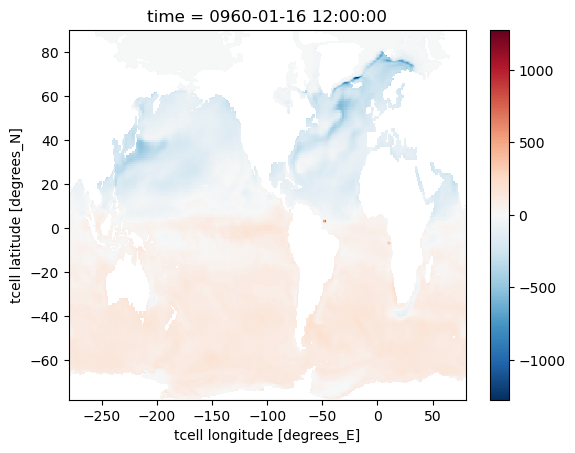

In [30]:
net_sfc_heating[0].plot()

In [20]:
net_sfc_heating = DS.net_sfc_heating
sfc_hflux_coupler = DS.sfc_hflux_coupler
sfc_hflux_pme= DS.sfc_hflux_pme
sfc_hflux_from_runoff = DS.sfc_hflux_from_runoff
sfc_hflux_from_calving = DS.sfc_hflux_from_calving

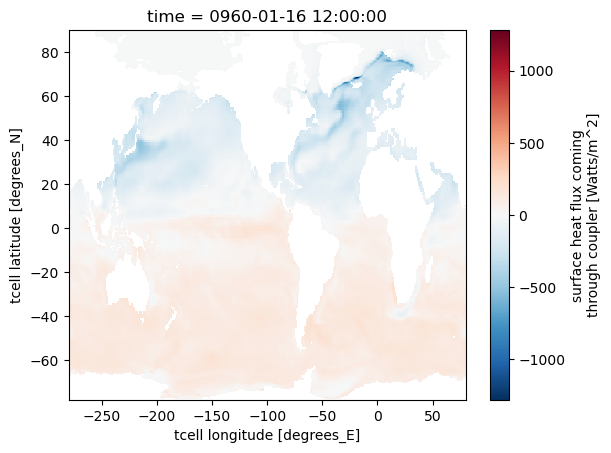

In [66]:
sfc_hflux_coupler[0].plot()

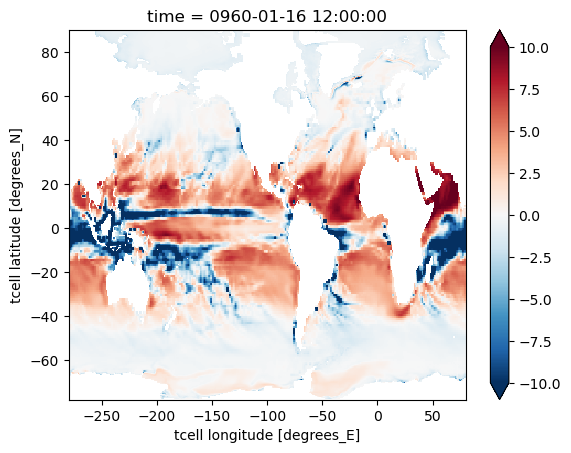

In [32]:
(sfc_hflux_coupler - Qnet_int)[0].plot(vmin = -10)

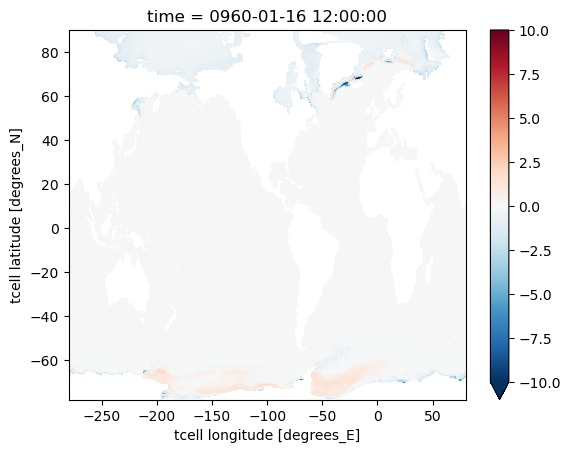

In [33]:
(net_sfc_heating[0] - 
 (sfc_hflux_coupler + sfc_hflux_pme + sfc_hflux_from_runoff + sfc_hflux_from_calving)[0]).plot(vmin = -10)

In [21]:
dTdt = DS.temp_tendency

In [22]:
temp_xflux_adv = DS.temp_xflux_adv
temp_yflux_adv = DS.temp_yflux_adv
temp_zflux_adv = DS.temp_zflux_adv

In [58]:
temp_xflux_adv

<xarray.DataArray 'temp_xflux_adv' (time: 12, st_ocean: 50, yt_ocean: 300,
                                    xu_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77temp_xflux_adv, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
Attributes:
    long_name:      cp*rho*dzt*dyt*u*temp
    units:          Watts
    valid_range:    [-1.e+18  1.e+18]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT

In [24]:
import xgcm

In [25]:
ds1 = xr.merge([temp_xflux_adv, temp_yflux_adv, temp_zflux_adv])

In [26]:
ds1 = ds1.drop(['geolon_t', 'geolat_t'])

In [27]:
grid2 = xgcm.Grid(
    ds1,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"},
            "Z": {"center": "st_ocean", "left": "sw_ocean"}}
)


In [28]:
grid2

<xgcm.Grid>
X Axis (periodic, boundary=None):
  * center   xt_ocean --> right
  * right    xu_ocean --> center
Y Axis (periodic, boundary=None):
  * center   yt_ocean --> right
  * right    yu_ocean --> center
Z Axis (periodic, boundary=None):
  * center   st_ocean --> left
  * left     sw_ocean --> center

In [29]:
w_ad = grid2.interp(ds1.temp_zflux_adv, axis = "Z", to="center")

In [30]:
v_ad = grid2.interp(ds1.temp_yflux_adv, axis = "Y", to="center")

In [31]:
u_ad = grid2.interp(ds1.temp_xflux_adv, axis = "X", to="center")

In [40]:
DS.area_t

<xarray.DataArray 'area_t' (yt_ocean: 300, xt_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77area_t, shape=(300, 360), dtype=float32, chunksize=(300, 360), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
Attributes:
    long_name:     tracer cell area
    units:         m^2
    valid_range:   [0.e+00 1.e+15]
    cell_methods:  time: point

In [129]:
u_ad[0,:].drop("time")

<xarray.DataArray 'temp_xflux_adv' (st_ocean: 50, yt_ocean: 300, xt_ocean: 360)>
dask.array<getitem, shape=(50, 300, 360), dtype=float32, chunksize=(50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5

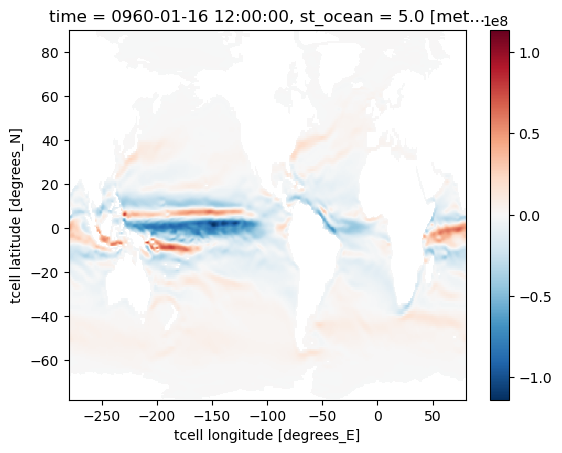

In [131]:
(u_ad[0,:]/DS.dyt/(DS.dht[0,:].drop("time")))[0].plot()

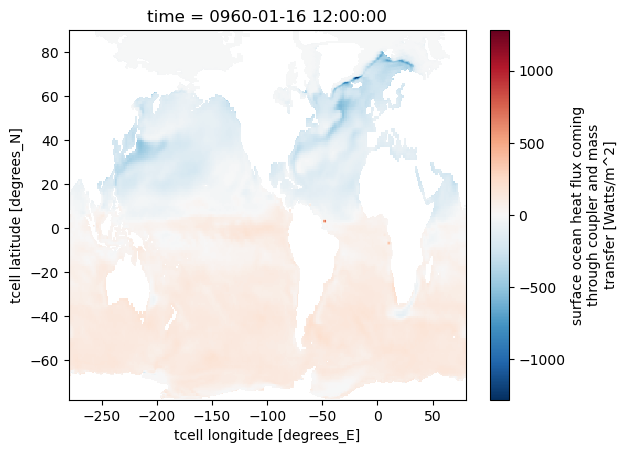

In [65]:
net_sfc_heating[0].plot()


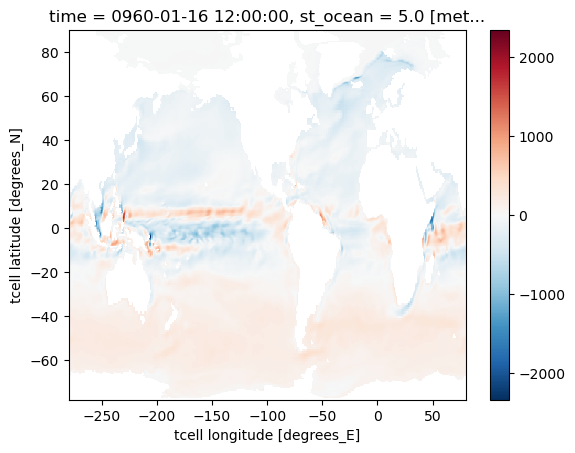

In [67]:
(((w_ad+u_ad+v_ad)/DS.area_t/DS.dht)[0,0]+sfc_hflux_coupler[0]).plot()

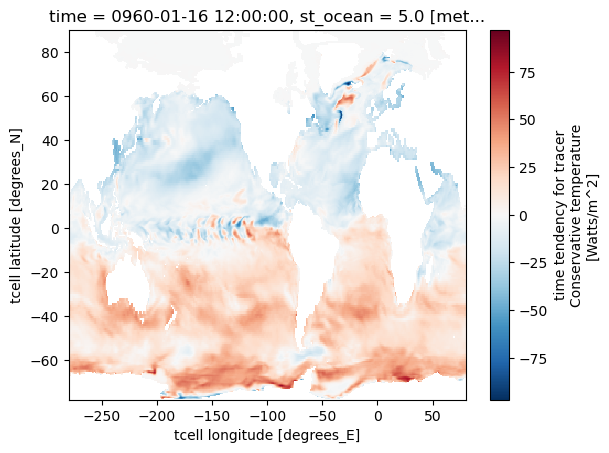

In [93]:
(dTdt[0,0]).plot()

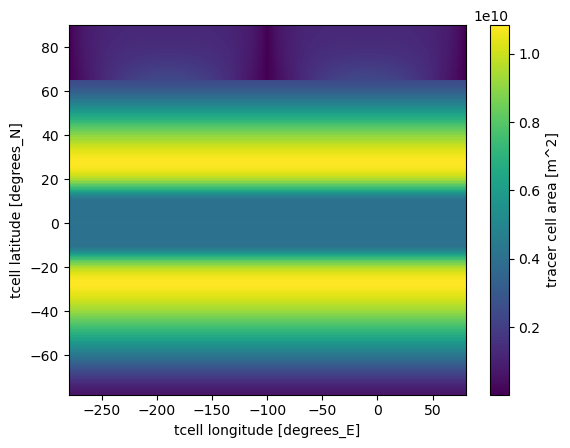

In [56]:
DS.area_t.plot()

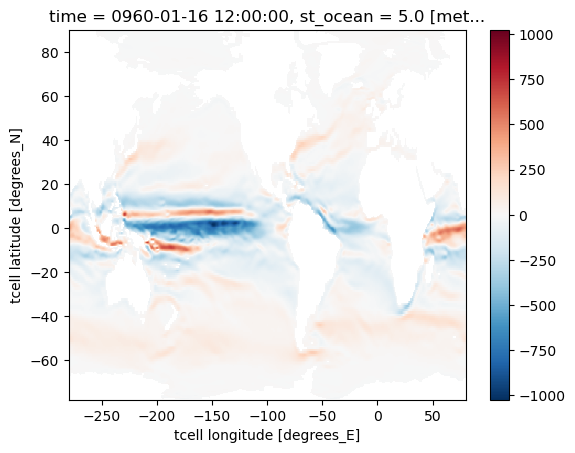

In [54]:
(u_ad/DS.dht/DS.area_t)[0,0].plot()

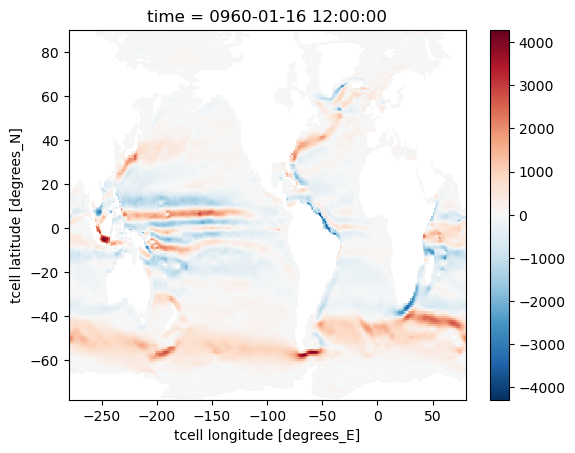

In [161]:
(u_ad/DS.area_t).mean("st_ocean")[0].plot()

In [172]:
T = DS.temp

In [173]:
u = DS.u

In [174]:
v = DS.v

In [175]:
w = DS.wt

In [176]:
ds2 = xr.merge([T, u, v, w])

In [177]:
ds2 = ds2.drop(['geolon_t', 'geolat_t'])

In [178]:
grid3 = xgcm.Grid(
    ds2,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"},
            "Z": {"center": "st_ocean", "left": "sw_ocean"}}
)


In [179]:
w = grid3.interp(ds2.wt, axis = "Z", to="center")

In [180]:
v = grid3.interp(ds2.v, axis = {"X", "Y"}, to="center")

In [181]:
u = grid3.interp(ds2.u, axis = {"X","Y"}, to="center")

In [250]:
dtdx = T.differentiate('xt_ocean', edge_order = 1) / DS.dxt

In [254]:
dtdy = T.differentiate('yt_ocean', edge_order = 1) / DS.dyt

In [255]:
dtdz = T.differentiate('st_ocean', edge_order = 1) / DS.dht

In [296]:
ua = (u * dtdx * DS.rho *DS.dht*3992.1036)

In [297]:
va = (v * dtdy * DS.rho *DS.dht*3992.1036)

In [298]:
wa = (w * dtdz * DS.rho *DS.dht*3992.1036)

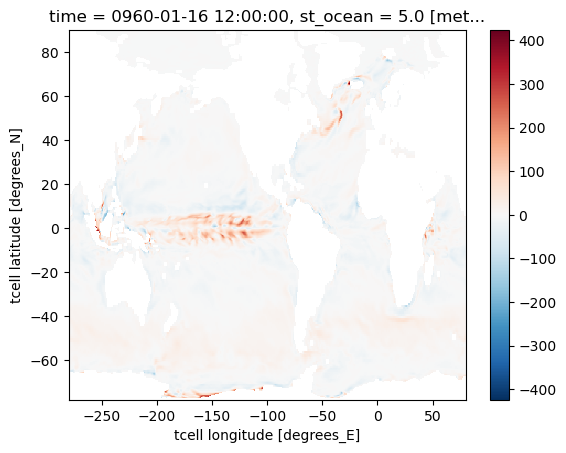

In [299]:
(ua+va+wa)[0,0].plot()

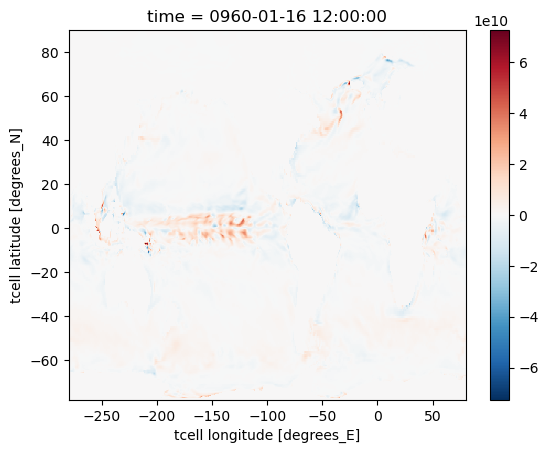

In [336]:
(DS.rho*3992*DS.dht*(ua+va+wa)).sel(st_ocean = slice(0,50)).sum("st_ocean")[0].plot()

In [338]:
adv_off50 = ((DS.rho*-3992*DS.dht*u*dtdx)+(DS.rho*-3992*DS.dht*v*dtdy)+(DS.rho*-3992*DS.dht*w*dtdz)).sel(st_ocean = slice(0,50)).sum("st_ocean")

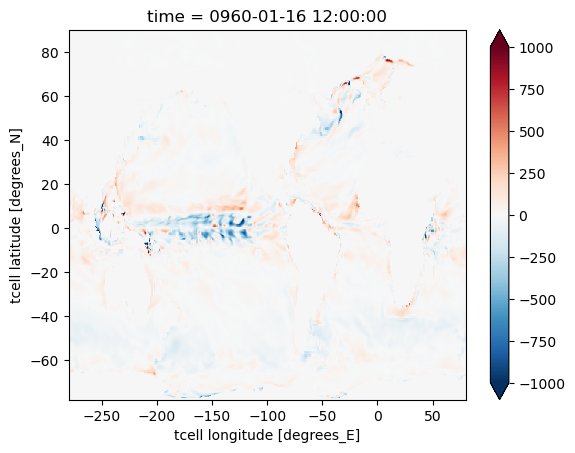

In [337]:
((DS.rho*-3992*DS.dht*u*dtdx)+(DS.rho*-3992*DS.dht*v*dtdy)+(DS.rho*-3992*DS.dht*w*dtdz)).sel(st_ocean = slice(0,50)).sum("st_ocean")[0].plot(vmin = -1000)

In [339]:
adv_on50 = tadv_0.sel(st_ocean = slice(0,50)).sum("st_ocean")

2023-12-06 17:13:10,538 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 6.08 GiB -- Worker memory limit: 9.00 GiB


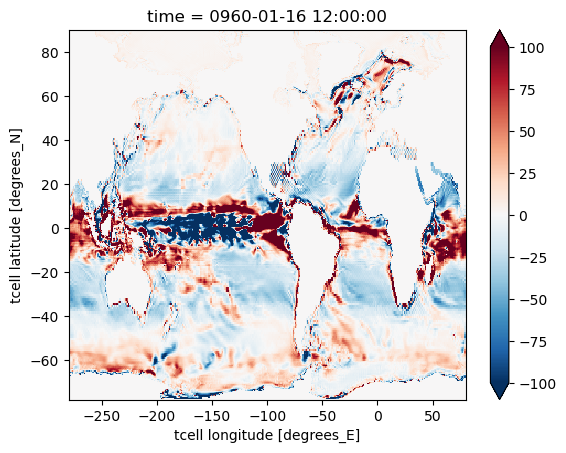

In [347]:
(adv_off50-adv_on50)[0].plot(vmin = -100)

2023-12-06 17:02:01,847 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 6.43 GiB -- Worker memory limit: 9.00 GiB


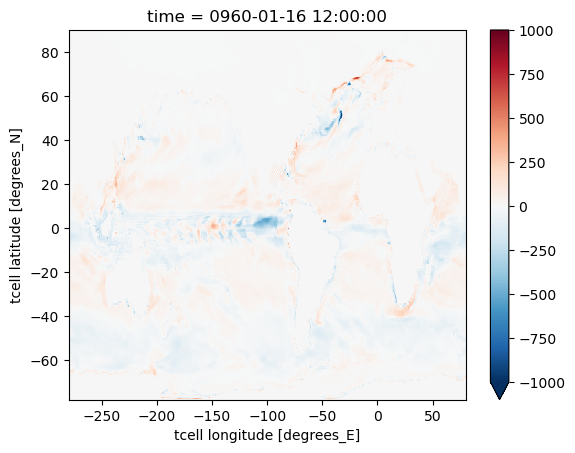

In [334]:
tadv_0.sel(st_ocean = slice(0,50)).sum("st_ocean")[0].plot(vmin = -1000)

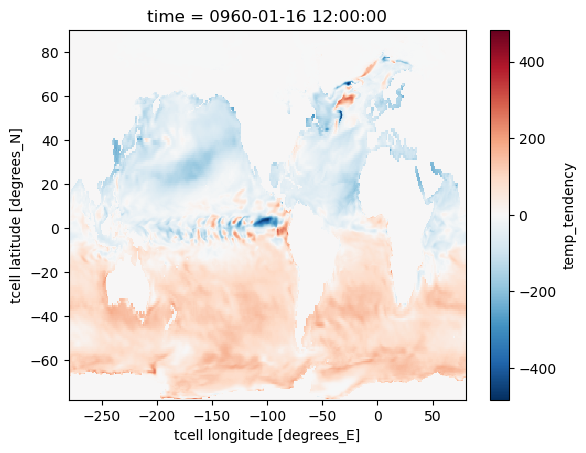

In [348]:
(dTdt).sel(st_ocean = slice(0,50)).sum("st_ocean")[0].plot()

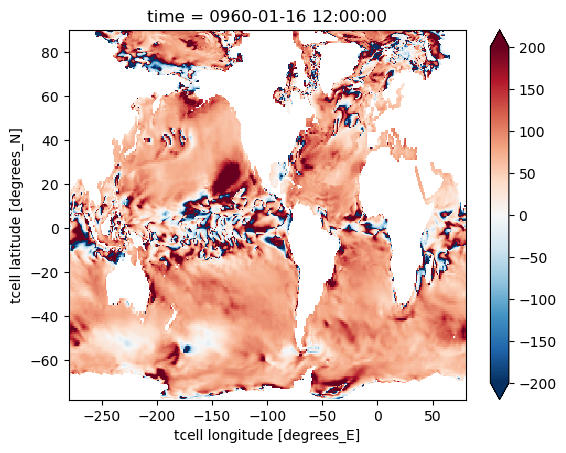

In [356]:
((((DS.dht*DS.rho*3992.103*T.differentiate(coord = 'time', edge_order=1,  datetime_unit= 's')).sel(st_ocean = slice(0,50)).sum("st_ocean")[0]) / 
 (dTdt.sel(st_ocean = slice(0,50)).sum("st_ocean")[0]))*100).plot(vmin = -200)

In [313]:
DS.ht

<xarray.DataArray 'ht' (yt_ocean: 300, xt_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77ht, shape=(300, 360), dtype=float32, chunksize=(300, 360), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
Attributes:
    long_name:      ocean depth on t-cells
    units:          m
    valid_range:    [-1.e+09  1.e+09]
    cell_methods:   time: point
    standard_name:  sea_floor_depth_below_geoid

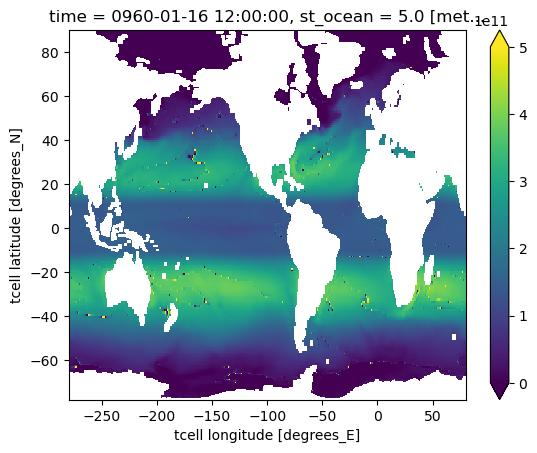

In [224]:
(u_ad[0,0]/(u*T)[0,0]).plot(vmin =0, vmax = 5e11)

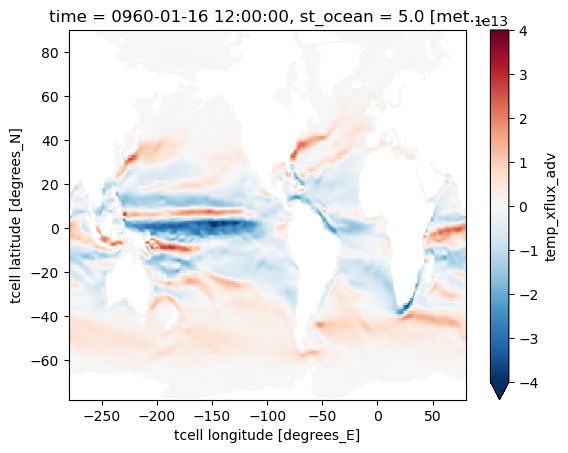

In [246]:
(u_ad[0,0]).plot(vmin = -4e13)

In [248]:
DS.dyt

<xarray.DataArray 'dyt' (yt_ocean: 300, xt_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77dyt, shape=(300, 360), dtype=float32, chunksize=(300, 360), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
Attributes:
    long_name:     ocean dyt on t-cells
    units:         m
    valid_range:   [-1.e+09  1.e+09]
    cell_methods:  time: point

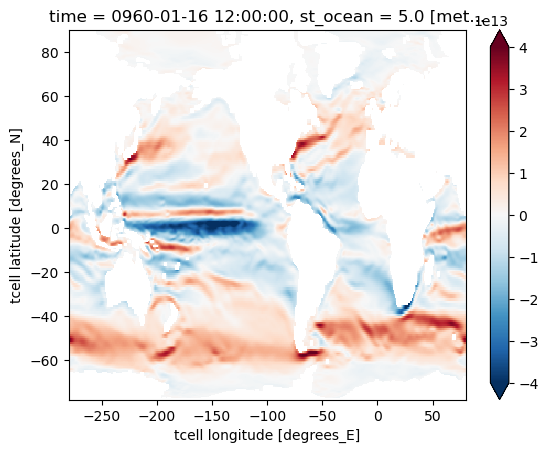

In [247]:
(u*T*DS.dyt*1035*3992.1)[0,0].plot(vmin = -4e13)

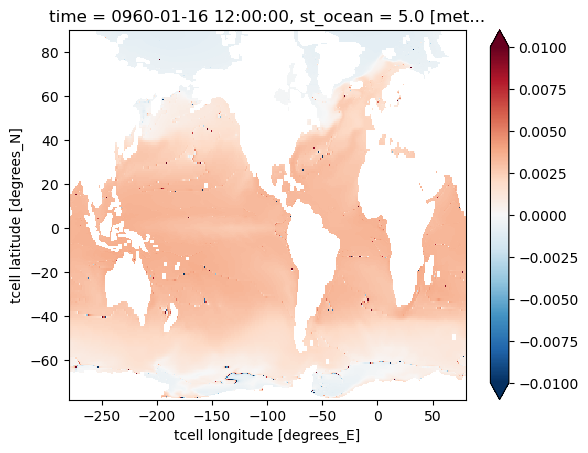

In [212]:
((u_ad[0,0]/(u*T)[0,0])/(DS.rho_dzt[0,0]*DS.area_t)).plot(vmin = -1e-2)

In [168]:
w_ad1 = grid2.interp(DS.temp_zflux_adv, axis = "Z", to="center")

In [169]:
v_ad1 = grid2.interp(DS.temp_yflux_adv, axis = "Y", to="center")

In [170]:
u_ad1 = grid2.interp(DS.temp_xflux_adv, axis = "X", to="center")

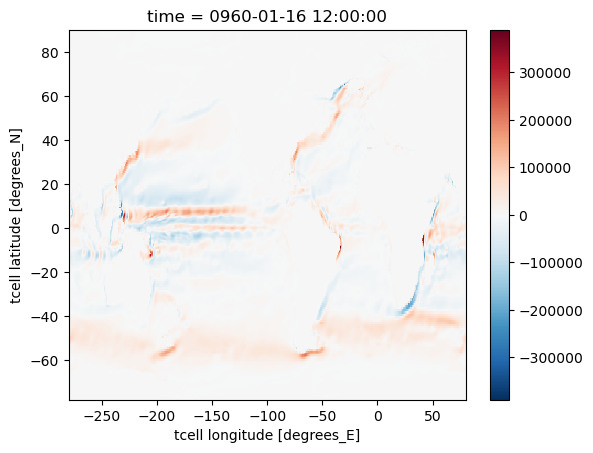

In [173]:
((w_ad1+u_ad1+v_ad1).sum("st_ocean")/DS.area_t)[0].plot()

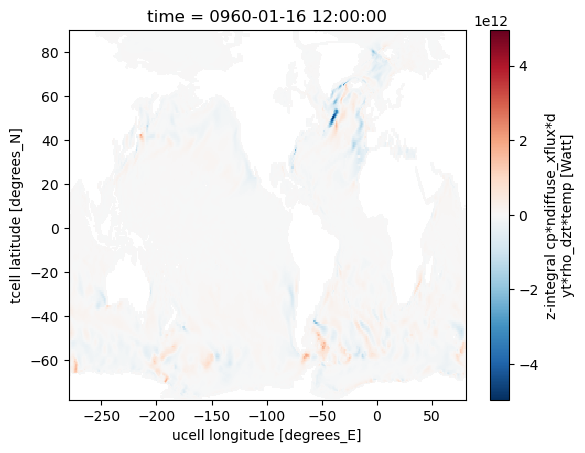

In [130]:
DS.temp_xflux_ndiffuse_int_z[0].plot()

In [127]:
test2 = (((u_ad+v_ad+w_ad)/DS.dht/DS.area_t).sum("st_ocean"))

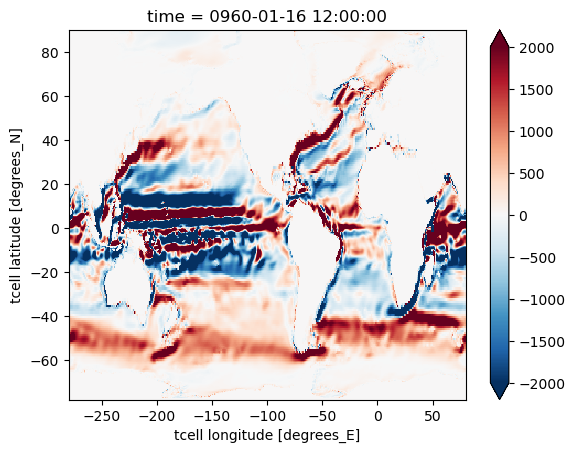

In [128]:
test2[0].plot(vmin = -2000)

In [121]:
test = ((u_ad/DS.dht).sum("st_ocean")/DS.area_t)+((v_ad/DS.dht).sum("st_ocean")/DS.area_t)+((w_ad/DS.dht).sum("st_ocean")/DS.area_t)

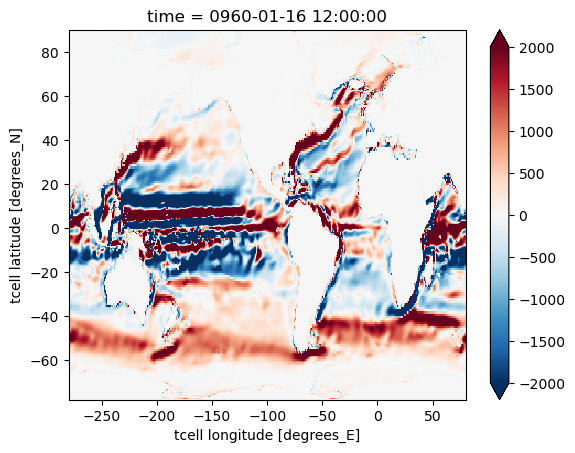

In [123]:
test[0].plot(vmin = -2000)

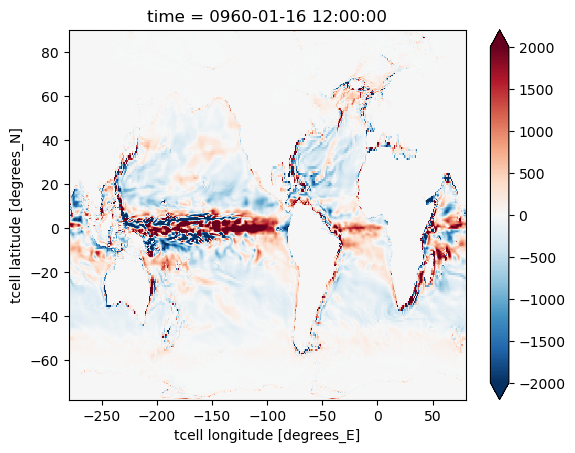

In [119]:
((w_ad/DS.dht).sum("st_ocean")/DS.area_t)[0].plot(vmin = -2000)

In [106]:
u_ad_wm = (u_ad/DS.area_t).sum("st_ocean")
v_ad_wm = (v_ad/DS.area_t).sum("st_ocean")
w_ad_wm = (w_ad/DS.area_t).sum("st_ocean")


In [107]:
ad_test = u_ad_wm+v_ad_wm+w_ad_wm

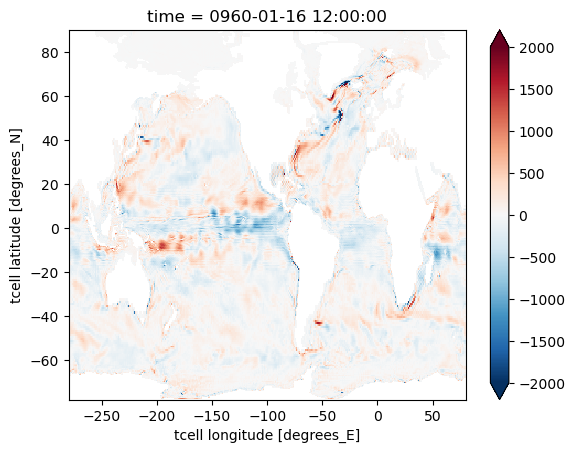

In [110]:
tadv[0].plot(vmin = -2000)

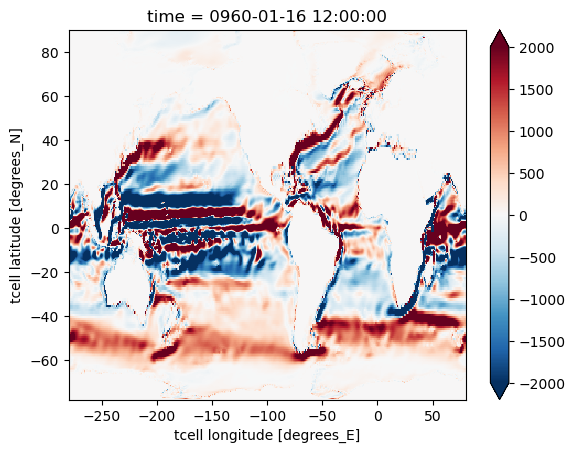

In [111]:
ad_test[0].plot(vmin = -2000)

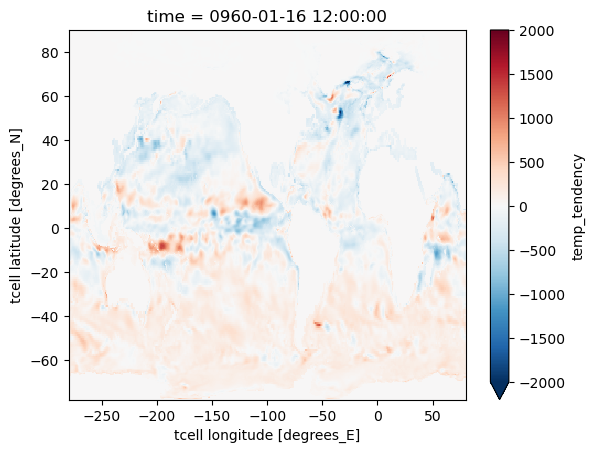

In [112]:
dTdt.sum("st_ocean")[0].plot(vmin = -2000)

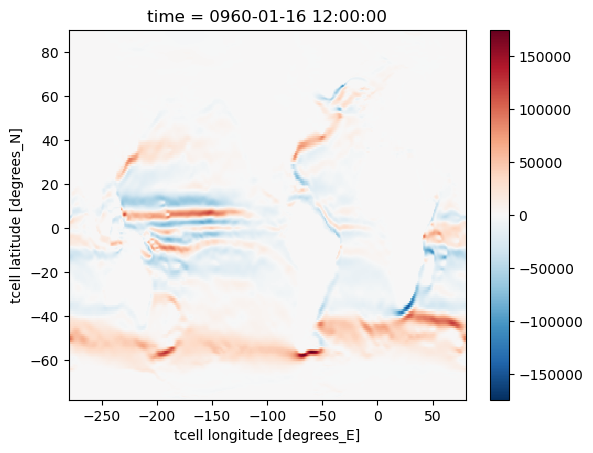

In [40]:
(u_ad.sum("st_ocean")/DS.area_t)[0].plot()

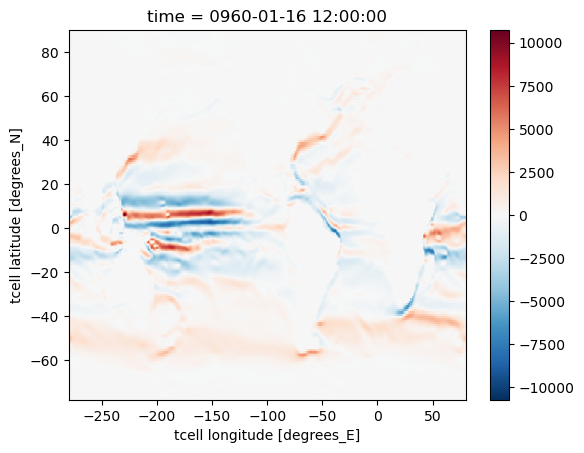

In [105]:
u_ad_wm[0].plot()

In [114]:
temp_xflux_adv.sum("st_ocean")

<xarray.DataArray 'temp_xflux_adv' (time: 12, yt_ocean: 300, xu_ocean: 360)>
dask.array<sum-aggregate, shape=(12, 300, 360), dtype=float32, chunksize=(12, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0

In [84]:
ad = w_ad+v_ad+u_ad

In [85]:
temp_xflux_adv

<xarray.DataArray 'temp_xflux_adv' (time: 12, st_ocean: 50, yt_ocean: 300,
                                    xu_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77temp_xflux_adv, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
Attributes:
    long_name:      cp*rho*dzt*dyt*u*temp
    units:          Watts
    valid_range:    [-1.e+18  1.e+18]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT

In [86]:
ad2 = w_ad.sum("st_ocean")+v_ad.sum("st_ocean")+u_ad.sum("st_ocean")

In [87]:
total_ad = ad.sum("st_ocean")

In [92]:
DS.temp_xflux_adv

<xarray.DataArray 'temp_xflux_adv' (time: 12, st_ocean: 50, yt_ocean: 300,
                                    xu_ocean: 360)>
dask.array<open_dataset-fe8d956c520eca9461f4ff297428f610temp_xflux_adv, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
Attributes:
    long_name:      cp*rho*dzt*dyt*u*temp
    units:          Watts
    valid_range:    [-1.e+18  1.e+18]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT

In [103]:
DS.dht

<xarray.DataArray 'dht' (time: 12, st_ocean: 50, yt_ocean: 300, xt_ocean: 360)>
dask.array<open_dataset-fe8d956c520eca9461f4ff297428f610dht, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
    geolat_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolon_t  (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
Attributes:
    long_name:      t-cell thickness
    units:          m
    valid_range:    [-1.e+01  1.e+05]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  cell_thickness

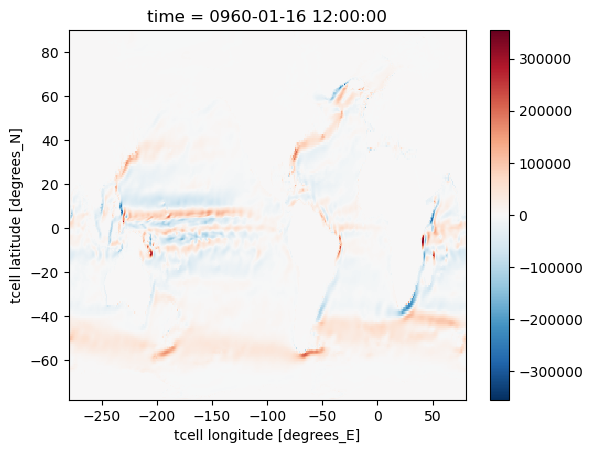

In [88]:
(ad2/DS.area_t/DS.dht)[0].plot()

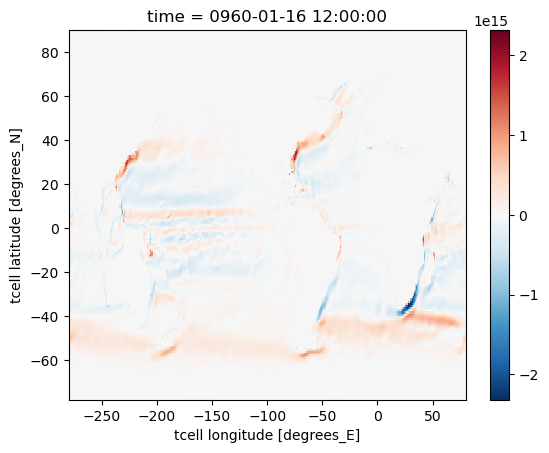

In [102]:
total_ad[0].plot()

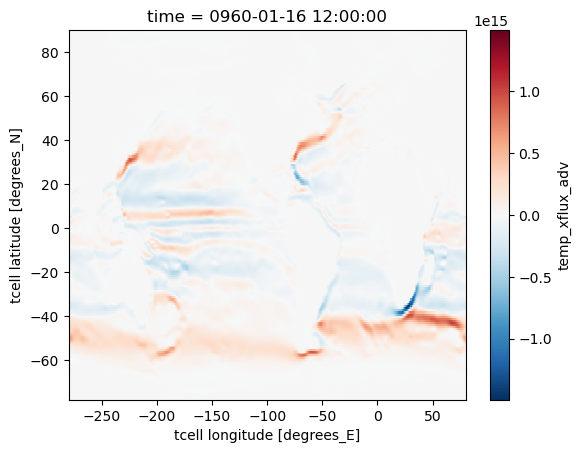

In [99]:
u_ad.sum("st_ocean")[0].plot()

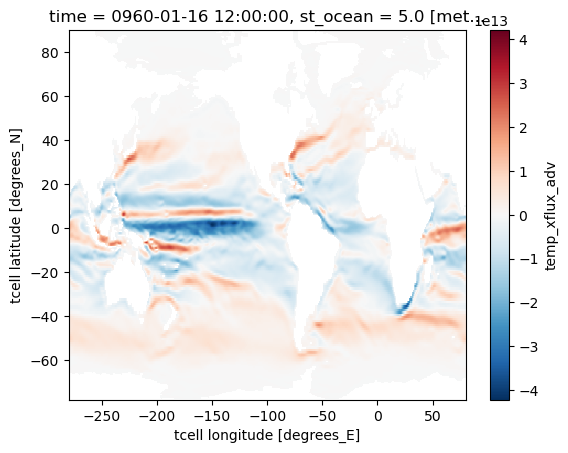

In [143]:
u_ad[0,0].plot()

In [171]:
uad1 = u_ad1.sel(yt_ocean = slice(-20,0), xt_ocean = slice(-250, -205))
uad = u_ad.sel(yt_ocean = slice(-20,0), xt_ocean = slice(-250, -205))

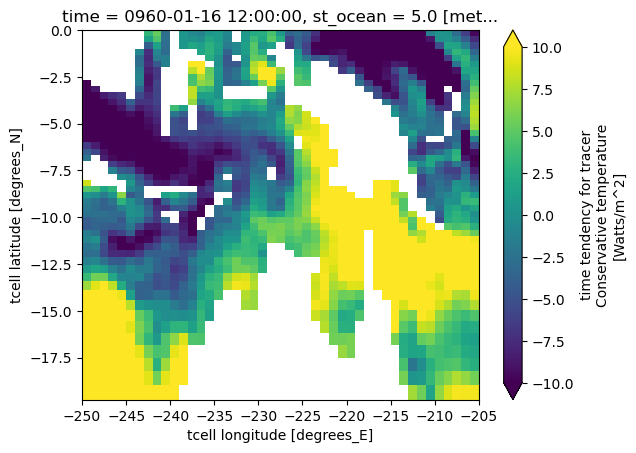

In [168]:
dTdt.sel(yt_ocean = slice(-20,0), xt_ocean = slice(-250, -205))[0,0].plot(vmin = -10, cmap= "viridis")

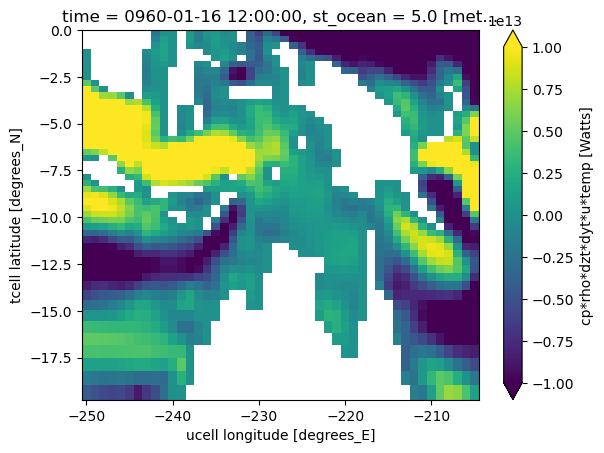

In [166]:
temp_xflux_adv.sel(yt_ocean = slice(-20,0), xu_ocean = slice(-250, -205))[0,0].plot(vmin = -1e13, cmap= "viridis")

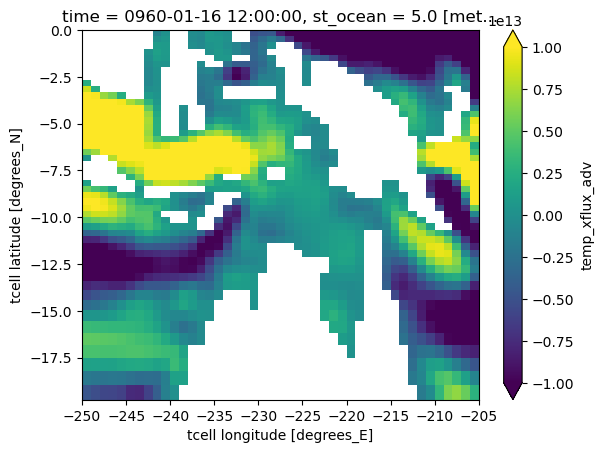

In [169]:
uad1[0,0].plot(vmin = -1e13, cmap= "viridis")

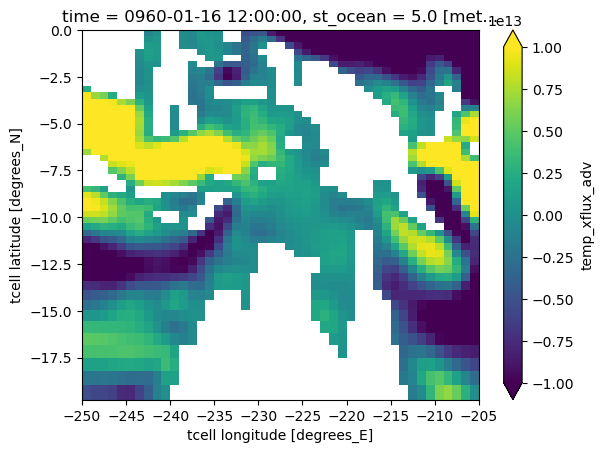

In [172]:
uad[0,0].plot(vmin = -1e13, cmap= "viridis")

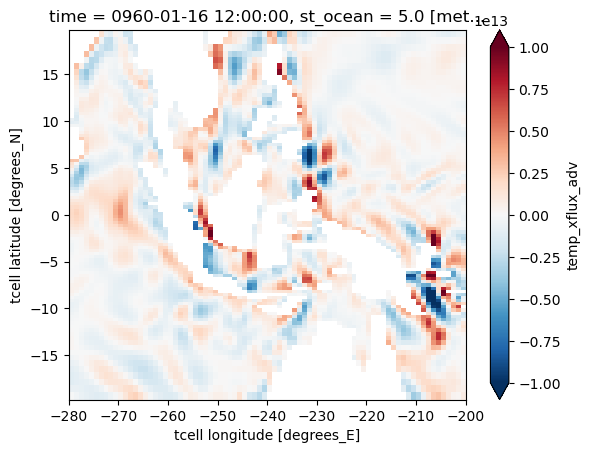

In [155]:
(uad1 - uad)[0,0].plot(vmin = -1e13)

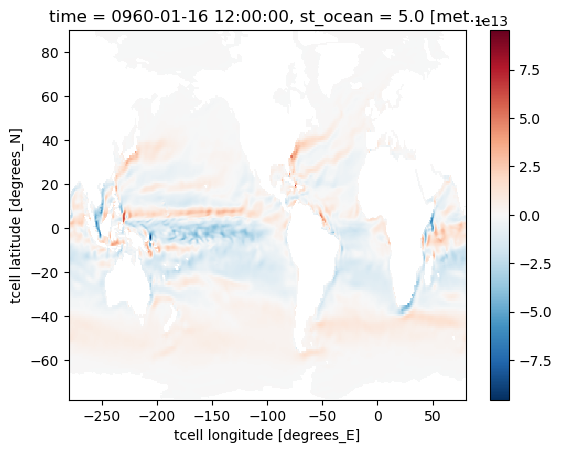

In [133]:
(w_ad+u_ad+v_ad)[0,0].plot()

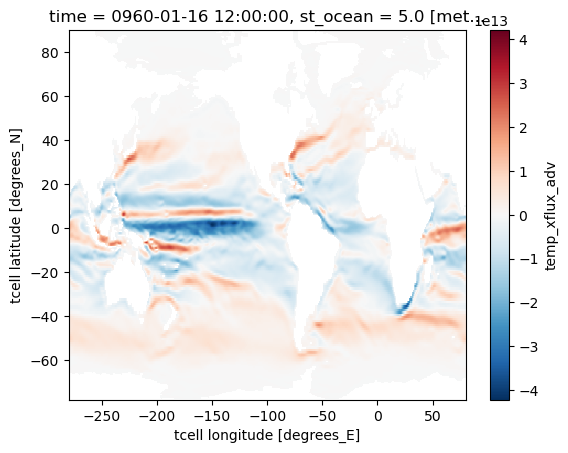

In [134]:
u_ad[0,0].plot()

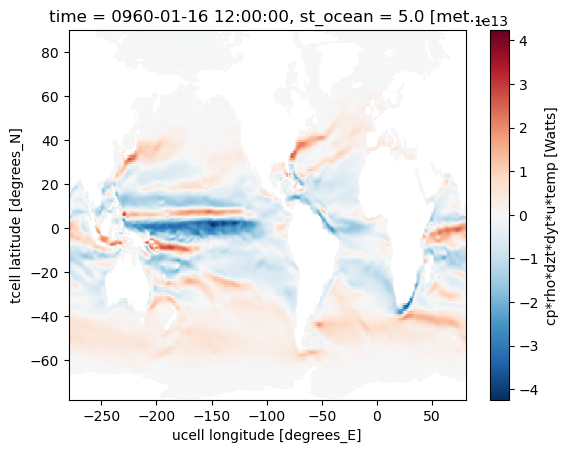

In [135]:
ds.temp_xflux_adv[0,0].plot()

In [55]:
grid.interp( grid.diff(ds.temp_xflux_adv, 'X') / grid.interp(ds.dxu, 'X'), 'X')

<xarray.DataArray (time: 12, st_ocean: 50, yt_ocean: 300, xu_ocean: 360,
                   yu_ocean: 300)>
dask.array<transpose, shape=(12, 50, 300, 360, 300), dtype=float32, chunksize=(12, 50, 300, 360, 300), chunktype=numpy.ndarray>
Coordinates:
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * yu_ocean  (yu_ocean) float64 -77.75 -77.51 -77.26 -77.01 ... 89.1 89.55 90.0
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03

In [37]:
# Take topographic gradient (simple gradient over one grid cell) and move back to u-grid
dhu_dx = grid.interp( grid.diff(ds.hu, 'X') / grid.interp(ds.dxu, 'X'), 'X')

# In meridional direction, we need to specify what happens at the boundary
dhu_dy = grid.interp( grid.diff(ds.hu, 'Y', boundary='extend') / grid.interp(ds.dyt, 'X'), 'Y', boundary='extend')

# Select latitude slice
dhu_dx = dhu_dx.sel(yu_ocean=lat_slice)
dhu_dy = dhu_dy.sel(yu_ocean=lat_slice)

# Magnitude of the topographic slope (to normalise the topographic gradient)
topographic_slope_magnitude = np.sqrt(dhu_dx**2 + dhu_dy**2)


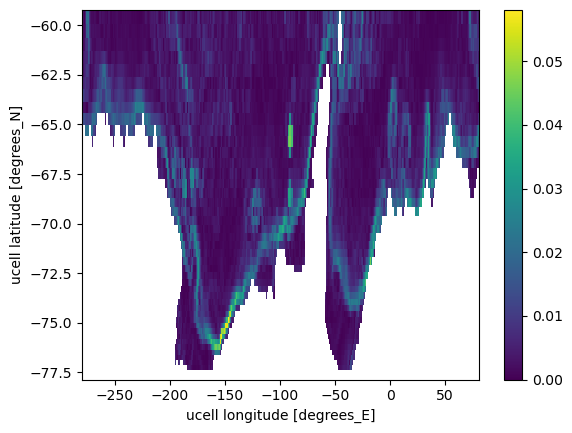

In [39]:
topographic_slope_magnitude.plot()

In [40]:
u = DS.u
v = DS.v

In [41]:
u_along = u * dhu_dy / topographic_slope_magnitude - v * dhu_dx / topographic_slope_magnitude

In [42]:
u_along

<xarray.DataArray (time: 12, st_ocean: 50, yu_ocean: 44, xu_ocean: 360)>
dask.array<sub, shape=(12, 50, 44, 360), dtype=float32, chunksize=(12, 50, 44, 360), chunktype=numpy.ndarray>
Coordinates:
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * yu_ocean  (yu_ocean) float64 -77.75 -77.51 -77.26 ... -60.96 -60.27 -59.57
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
    geolat_c  (yu_ocean, xu_ocean) float32 dask.array<chunksize=(44, 360), meta=np.ndarray>
    geolon_c  (yu_ocean, xu_ocean) float32 dask.array<chunksize=(44, 360), meta=np.ndarray>

In [129]:
temp_xflux_adv

<xarray.DataArray 'temp_xflux_adv' (time: 12, st_ocean: 50, yt_ocean: 300,
                                    xu_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77temp_xflux_adv, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
Attributes:
    long_name:      cp*rho*dzt*dyt*u*temp
    units:          Watts
    valid_range:    [-1.e+18  1.e+18]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT

In [125]:
face_connections = {'face':
                    {0: {'X':  ((12, 'Y', False), (3, 'X', False)),
                         'Y':  (None,             (1, 'Y', False))},
                     1: {'X':  ((11, 'Y', False), (4, 'X', False)),
                         'Y':  ((0, 'Y', False),  (2, 'Y', False))},
                     2: {'X':  ((10, 'Y', False), (5, 'X', False)),
                         'Y':  ((1, 'Y', False),  (6, 'X', False))},
                     3: {'X':  ((0, 'X', False),  (9, 'Y', False)),
                         'Y':  (None,             (4, 'Y', False))},
                     4: {'X':  ((1, 'X', False),  (8, 'Y', False)),
                         'Y':  ((3, 'Y', False),  (5, 'Y', False))},
                     5: {'X':  ((2, 'X', False),  (7, 'Y', False)),
                         'Y':  ((4, 'Y', False),  (6, 'Y', False))},
                     6: {'X':  ((2, 'Y', False),  (7, 'X', False)),
                         'Y':  ((5, 'Y', False),  (10, 'X', False))},
                     7: {'X':  ((6, 'X', False),  (8, 'X', False)),
                         'Y':  ((5, 'X', False),  (10, 'Y', False))},
                     8: {'X':  ((7, 'X', False),  (9, 'X', False)),
                         'Y':  ((4, 'X', False),  (11, 'Y', False))},
                     9: {'X':  ((8, 'X', False),  None),
                         'Y':  ((3, 'X', False),  (12, 'Y', False))},
                     10: {'X': ((6, 'Y', False),  (11, 'X', False)),
                          'Y': ((7, 'Y', False),  (2, 'X', False))},
                     11: {'X': ((10, 'X', False), (12, 'X', False)),
                          'Y': ((8, 'Y', False),  (1, 'X', False))},
                     12: {'X': ((11, 'X', False), None),
                          'Y': ((9, 'Y', False),  (0, 'X', False))}}}

In [128]:
grid = xgcm.Grid(ds, periodic=False, face_connections=face_connections)
grid

NameError: name 'ds' is not defined

In [115]:
grid = xgcm.Grid(
    DS,
    coords={"X": {"center": "xt_ocean", "right": "xu_ocean"},
            "Y": {"center": "yt_ocean", "right": "yu_ocean"},
            "Z": {"center": "st_ocean", "left": "sw_ocean"}}
)

In [116]:
grid

<xgcm.Grid>
X Axis (periodic, boundary=None):
  * center   xt_ocean --> right
  * right    xu_ocean --> center
Y Axis (periodic, boundary=None):
  * center   yt_ocean --> right
  * right    yu_ocean --> center
Z Axis (periodic, boundary=None):
  * center   st_ocean --> left
  * left     sw_ocean --> center

In [121]:
div_temp_yflux_adv = grid.diff(temp_yflux_adv, 'X') + grid.diff(temp_yflux_adv, 'Z', boundary="extend")
div_temp_xflux_adv = grid.diff(temp_xflux_adv, 'Y') + grid.diff(temp_xflux_adv, 'Z', boundary="extend")
div_temp_zflux_adv = grid.diff(temp_zflux_adv, 'X') + grid.diff(temp_zflux_adv, 'Y')


In [122]:
total_temp_adv = div_temp_yflux_adv + div_temp_xflux_adv + div_temp_zflux_adv


In [124]:
div_temp_zflux_adv

<xarray.DataArray 'temp_zflux_adv' (time: 12, sw_ocean: 50, yt_ocean: 300,
                                    xu_ocean: 360, yu_ocean: 300, xt_ocean: 360)>
dask.array<add, shape=(12, 50, 300, 360, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * sw_ocean  (sw_ocean) float64 10.0 20.0 30.0 ... 5.333e+03 5.665e+03 6e+03
  * xt_ocean  (xt_ocean) float64 -279.5 -278.5 -277.5 -276.5 ... 77.5 78.5 79.5
  * yu_ocean  (yu_ocean) float64 -77.75 -77.51 -77.26 -77.01 ... 89.1 89.55 90.0

In [68]:
tsubmeso = DS.temp_submeso

In [69]:
tvdifuss = DS.temp_vdiffuse_diff_cbt

In [70]:
tNLkpp = DS.temp_nonlocal_KPP

In [71]:
vmix = tvdifuss + tNLkpp

In [72]:
sw_pn = DS.sw_heat

In [73]:
triver = DS.temp_rivermix
tvdbc = DS.temp_vdiffuse_sbc
sfc_hflux = DS.sfc_hflux_pme

In [74]:
Qnet = sw_pn + triver +tvdbc +sfc_hflux

In [75]:
Qnet_intz = Qnet.sum("st_ocean")

In [76]:
f3d = DS.frazil_3d

In [77]:
tvdiffk33 = DS.temp_vdiffuse_k33

In [78]:
tNeutdiff = DS.neutral_diffusion_temp

In [79]:
mixing = tvdiffk33+tNeutdiff

In [80]:
admesoedy = DS.neutral_gm_temp

In [81]:
mdslop = DS.mixdownslope_temp

In [82]:
tsigdif = DS.temp_sigma_diff

In [83]:
tetasmth = DS.temp_eta_smooth

In [84]:
misc_mix = mdslop+tsigdif+tetasmth

In [331]:
tadv_0 = dTdt- (tsubmeso + vmix + Qnet +f3d +mixing +admesoedy+misc_mix)

In [99]:
tadv_0 = dTdt[0,0]- (tsubmeso[0,0] + vmix[0,0] + Qnet[0,0] +f3d[0,0] +mixing[0,0] +admesoedy[0,0]+misc_mix[0,0])

In [85]:
tadv = dTdt.sum("st_ocean") - (tsubmeso.sum("st_ocean") + vmix.sum("st_ocean") + Qnet_int +f3d.sum("st_ocean") +mixing.sum("st_ocean") +admesoedy.sum("st_ocean")+misc_mix.sum("st_ocean"))

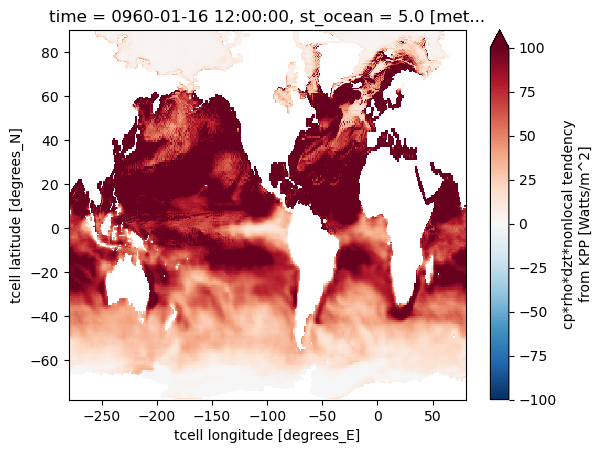

In [112]:
tNLkpp[0,0].plot(vmin = -100)

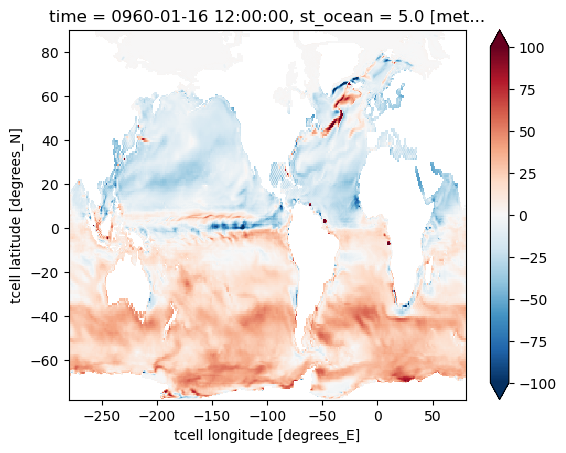

In [107]:
(tsubmeso[0,0] + vmix[0,0] + Qnet[0,0] +f3d[0,0] +mixing[0,0] +admesoedy[0,0]+misc_mix[0,0]).plot(vmin = -100)

2023-12-06 16:06:39,148 - distributed.worker.memory - WARNING - Unmanaged memory use is high. This may indicate a memory leak or the memory may not be released to the OS; see https://distributed.dask.org/en/latest/worker-memory.html#memory-not-released-back-to-the-os for more information. -- Unmanaged memory: 6.48 GiB -- Worker memory limit: 9.00 GiB


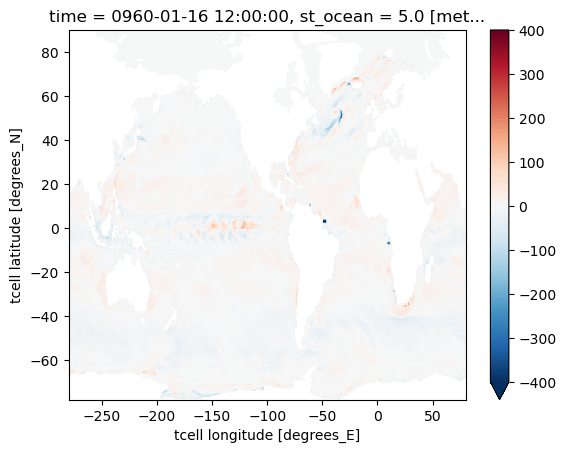

In [303]:
tadv_0[0,0].plot(vmax = 400)

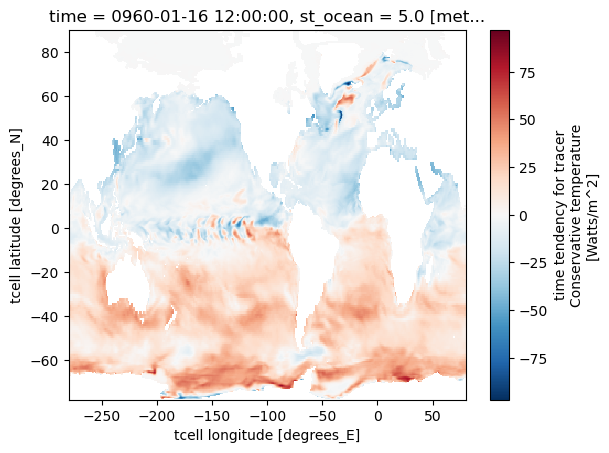

In [103]:
dTdt[0,0].plot()

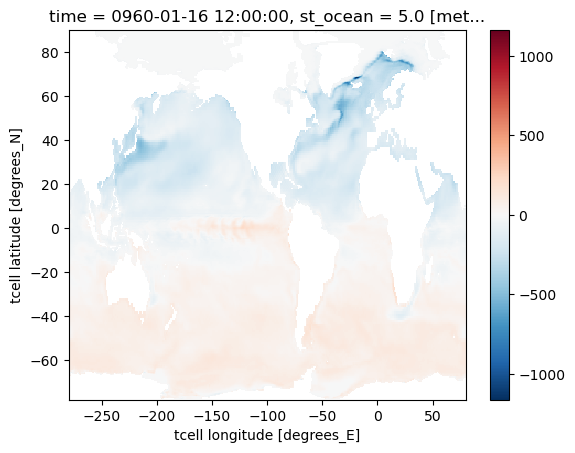

In [105]:
(tadv_0+Qnet[0,0]).plot()

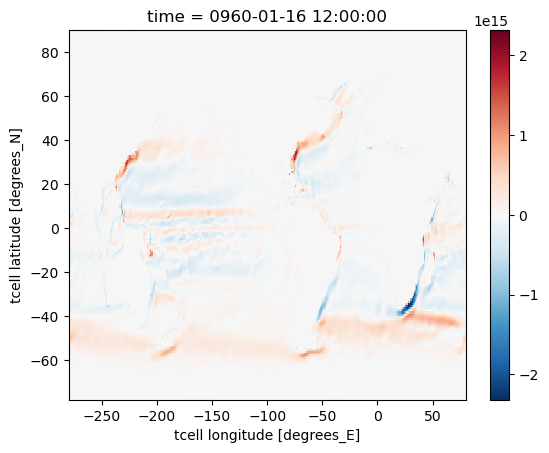

In [248]:
total_ad[0].plot()

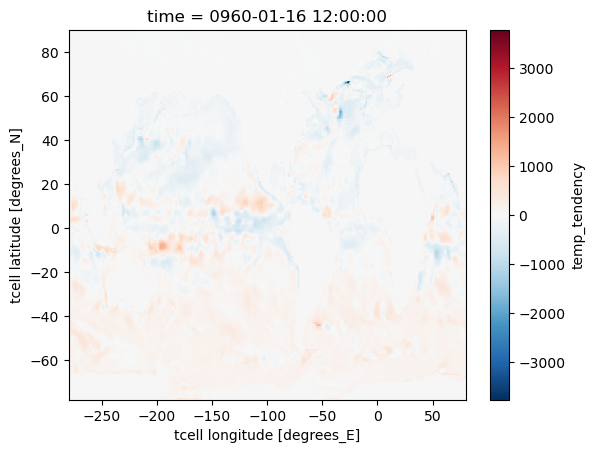

In [37]:
dTdt.sum("st_ocean")[0].plot()

In [10]:
u = DS.u

In [11]:
dens = DS.rho

In [12]:
utrans = DS.tx_trans

In [50]:
utrans

<xarray.DataArray 'tx_trans' (time: 12, st_ocean: 50, yt_ocean: 300,
                              xu_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77tx_trans, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 -77.88 -77.63 -77.38 ... 88.87 89.32 89.77
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
Attributes:
    long_name:      T-cell i-mass transport
    units:          kg/s
    valid_range:    [-1.e+20  1.e+20]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  ocean_x_mass_transport

In [54]:
def get_weights(INP):
    weights = INP.st_ocean
    #add a 0m surface layer
    wt=np.array([0.])
    for i in range(len(weights.values)):
        NW = 2*weights.values[i]-wt[i]
        wt = np.insert(wt,i+1,NW)
    thickness = wt[1:]-wt[:-1]
    thickness_DA = xr.DataArray(thickness, coords={'st_ocean': INP.st_ocean},
                 dims=['st_ocean'])
    return thickness_DA


In [59]:
test = DS.area_t

In [63]:
test = test.rename({"xt_ocean":"xu_ocean"})

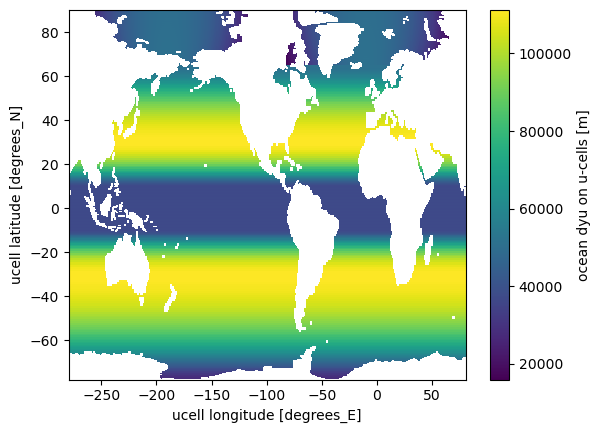

In [98]:
DS.dyu.plot()

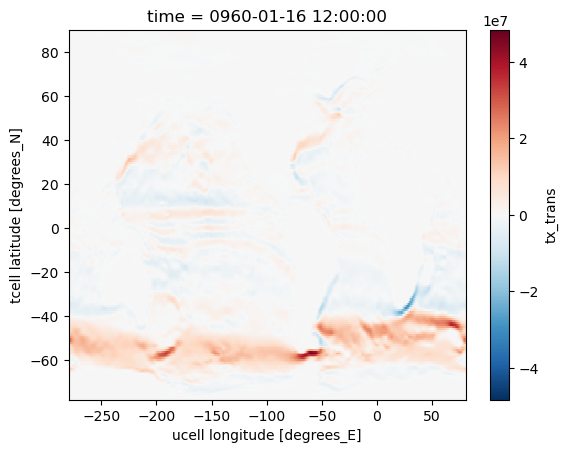

In [94]:
(utrans/1036).sum("st_ocean")[0].plot()

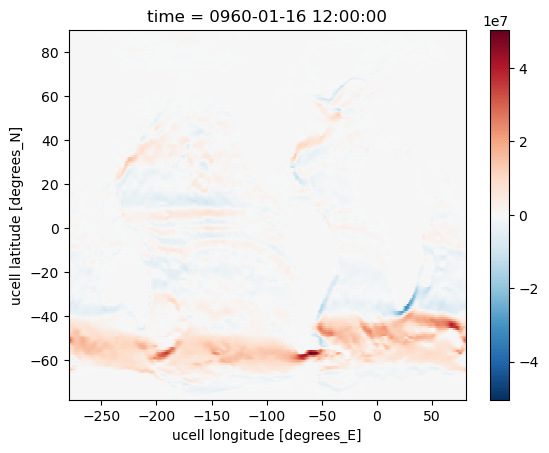

In [99]:
(((u*levs*DS.dyu).sum("st_ocean")[0])).plot()

In [86]:
test = utrans.rename({"yt_ocean":"yu_ocean"})

In [89]:
test1 = test.assign_coords(yu_ocean=u.yu_ocean)

In [90]:
test1

<xarray.DataArray 'tx_trans' (time: 12, st_ocean: 50, yu_ocean: 300,
                              xu_ocean: 360)>
dask.array<open_dataset-ffdf4286157eeca00344b20ffc7cca77tx_trans, shape=(12, 50, 300, 360), dtype=float32, chunksize=(12, 50, 300, 360), chunktype=numpy.ndarray>
Coordinates:
  * yu_ocean  (yu_ocean) float64 -77.75 -77.51 -77.26 -77.01 ... 89.1 89.55 90.0
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
  * xu_ocean  (xu_ocean) float64 -279.0 -278.0 -277.0 -276.0 ... 78.0 79.0 80.0
  * st_ocean  (st_ocean) float64 5.0 15.0 25.0 ... 5.166e+03 5.499e+03 5.831e+03
Attributes:
    long_name:      T-cell i-mass transport
    units:          kg/s
    valid_range:    [-1.e+20  1.e+20]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    standard_name:  ocean_x_mass_transport

In [6]:
ρ0 = 1036

In [7]:
straits = {'Drake Passage': [ -69.9,      -69.9,     -71.6, -51.0],
           'Lombok':        [-244.5, -242.5,  -8.6,  -8.6],
           'Ombai' :        [-236.5, -236.5,  -10,  -8.7],
           'Timor' :        [-234.9, -234.9, -14.4,  -10],
           'Denmark' :      [-42,               -22,  65.8,  65.8],
           'Bering' :       [-172,             -167,  65.8,  65.8],
            }

In [8]:
def calc_transport(DS, strait):
    """
    Calculate barotropic transport across a given 
    line of latitude or longitude.
     
    Designed for flow through straits.
    """
    tx_trans = DS.tx_trans
    ty_trans = DS.ty_trans
    
    start_time=DS.time[0]
    end_time=DS.time[-1]
    xmin, xmax, ymin, ymax = straits[strait]
    
    if ymax >= 65:
        logging.warning('North of 65N the tripolar grid geometry brings complications and `.sum(''xt_ocean'')` is wrong!')
    
    print('Calculating: {} transport'.format(strait))
    
    if xmin == xmax:                
        #tx_trans = tx_trans.pint.quantify()

        transport = (tx_trans / ρ0).sel(time=slice(start_time, end_time))\
                                   .sel(xu_ocean=xmin, method='nearest')\
                                   .sel(yt_ocean=slice(ymin, ymax))\
                                   .sum('st_ocean').sum('yt_ocean')
        transport.attrs['long_name'] = 'zonal transport'

    elif ymin == ymax:
        #ty_trans = ty_trans.pint.quantify()
        
        transport = (ty_trans / ρ0).sel(time=slice(start_time, end_time))\
                                   .sel(yu_ocean=ymin, method='nearest')\
                                   .sel(xt_ocean=slice(xmin, xmax))\
                                   .sum('st_ocean').sum('xt_ocean')
        transport.attrs['long_name'] = 'meridional transport'
    else:
        raise ValueError('Transports are computed only along lines of either constant latitude or constant longitude')
    
    #transport = transport.pint.to('sverdrup')
    transport = transport.compute()
       
    return transport

In [9]:
tx_timor = calc_transport(DS, "Timor")

Calculating: Timor transport


In [100]:
u_timor = (u*levs*DS.dyu).sel(xu_ocean=-234.9, method='nearest')\
                                   .sel(yu_ocean=slice(-14.4,  -10))\
                                   .sum('st_ocean').sum('yu_ocean')

In [101]:
u_timor = u_timor.compute()

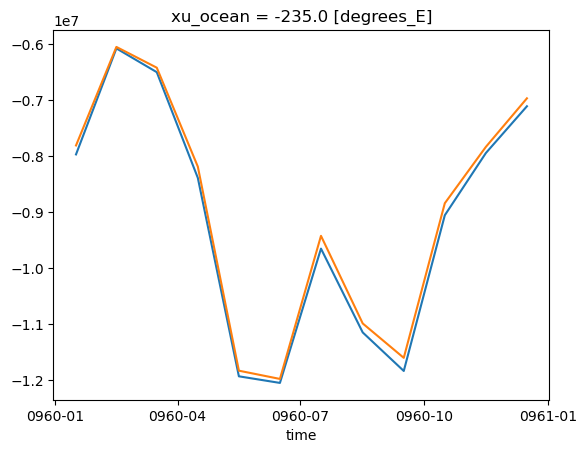

In [104]:
tx_timor.plot()
u_timor.plot()

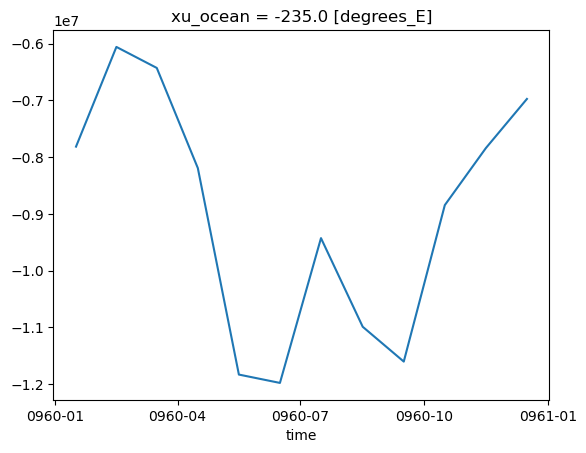

In [103]:
u_timor.plot()

In [72]:
DS.tx_trans[0,0, 100,200].values/1036

-4727.968146718146

In [78]:
u[0,0,100,200].values*10*108713.0625

-3118.5922218489577

In [77]:
DS.dxu[100,200].values

array(108713.0625)

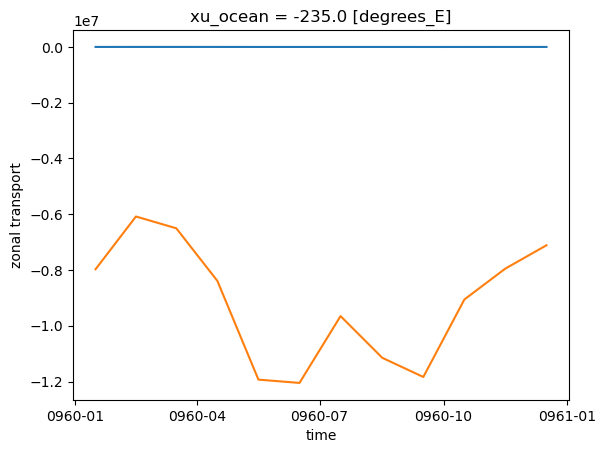

In [63]:
(u_timor/1e6).plot()
tx_timor.plot()

In [57]:
u_timor

<xarray.DataArray (time: 12)>
array([-6.8887898e+08, -4.9936806e+08, -4.6344954e+08, -6.0034522e+08,
       -8.8400077e+08, -9.2946310e+08, -8.4309478e+08, -8.9512134e+08,
       -1.0852184e+09, -9.7405222e+08, -8.4077626e+08, -7.4390042e+08],
      dtype=float32)
Coordinates:
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
    xu_ocean  float64 -235.0

In [44]:
tx_timor

<xarray.DataArray 'tx_trans' (time: 12)>
array([ -7973396. ,  -6082046.5,  -6506175. ,  -8392519. , -11932515. ,
       -12050334. ,  -9654234. , -11149485. , -11837140. ,  -9058227. ,
        -7948472.5,  -7114266.5], dtype=float32)
Coordinates:
  * time      (time) object 0960-01-16 12:00:00 ... 0960-12-16 12:00:00
    xu_ocean  float64 -235.0
Attributes:
    long_name:  zonal transport

In [46]:
DS

<xarray.Dataset>
Dimensions:                          (xt_ocean: 360, yt_ocean: 300, time: 12,
                                      nv: 2, xu_ocean: 360, yu_ocean: 300,
                                      st_ocean: 50, st_edges_ocean: 51,
                                      sw_ocean: 50, sw_edges_ocean: 51,
                                      grid_xu_ocean: 360, grid_yt_ocean: 300,
                                      potrho: 80, potrho_edges: 81,
                                      grid_xt_ocean: 360, grid_yu_ocean: 300)
Coordinates: (12/20)
  * xt_ocean                         (xt_ocean) float64 -279.5 -278.5 ... 79.5
  * yt_ocean                         (yt_ocean) float64 -77.88 -77.63 ... 89.77
  * time                             (time) object 0960-01-16 12:00:00 ... 09...
  * nv                               (nv) float64 1.0 2.0
  * xu_ocean                         (xu_ocean) float64 -279.0 -278.0 ... 80.0
  * yu_ocean                         (yu_ocean) float64 -77.75 -77.51 ... 90.0
    ...                               ...
  * grid_xt_ocean                    (grid_xt_ocean) float64 -279.5 ... 79.5
  * grid_yu_ocean                    (grid_yu_ocean) float64 -77.75 ... 90.0
    geolat_c                         (yu_ocean, xu_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolon_c                         (yu_ocean, xu_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolat_t                         (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    geolon_t                         (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
Data variables: (12/261)
    ht                               (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    hu                               (yu_ocean, xu_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    dxt                              (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    dyt                              (yt_ocean, xt_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    dxu                              (yu_ocean, xu_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    dyu                              (yu_ocean, xu_ocean) float32 dask.array<chunksize=(300, 360), meta=np.ndarray>
    ...                               ...
    salt_rivermix                    (time, st_ocean, yt_ocean, xt_ocean) float32 dask.array<chunksize=(12, 50, 300, 360), meta=np.ndarray>
    salt_sigma_diff                  (time, st_ocean, yt_ocean, xt_ocean) float32 dask.array<chunksize=(12, 50, 300, 360), meta=np.ndarray>
    average_T1                       (time) object dask.array<chunksize=(12,), meta=np.ndarray>
    average_T2                       (time) object dask.array<chunksize=(12,), meta=np.ndarray>
    average_DT                       (time) timedelta64[ns] dask.array<chunksize=(12,), meta=np.ndarray>
    time_bounds                      (time, nv) timedelta64[ns] dask.array<chunksize=(12, 2), meta=np.ndarray>
Attributes:
    filename:   /scratch/w97/zg0866/archive/cm000/history/ocn/ocean_month.nc-...
    title:      AusCOM_CMIP5
    grid_type:  regular
    grid_tile:  N/A